In [1]:
import sys
import os

ROOT = os.path.abspath("..")  # adjust if needed
print(ROOT)
OPENPCDET_PATH = '/storage/project/r-gchou3-0/spanse30/OpenPCDet'
print(OPENPCDET_PATH)
# # Put OpenPCDet FIRST
sys.path.insert(0, OPENPCDET_PATH)

# # Import OpenPCDet pcdet
import pcdet
print("Using pcdet from:", pcdet.__file__)

/storage/scratch1/9/spanse30
/storage/project/r-gchou3-0/spanse30/OpenPCDet
Using pcdet from: /storage/project/r-gchou3-0/spanse30/OpenPCDet/pcdet/__init__.py


In [2]:
import pickle as pkl

import os
from pathlib import Path
import copy
import numpy as np
import torch
    

In [3]:
from pcdet.config import cfg, cfg_from_yaml_file
from pcdet.models import build_network, load_data_to_gpu
from pcdet.datasets import build_dataloader
from pcdet.utils import common_utils
import random

import math
from dataclasses import dataclass
from typing import Dict, List, Optional, Tuple

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio

import importlib
import helpers_ptt
importlib.reload(helpers_ptt)
import torch.nn.functional as F

from collections import defaultdict

In [4]:
from pcdet.config import cfg, cfg_from_yaml_file
cfg.clear()

CFG_FILE_MF = '/storage/project/r-gchou3-0/spanse30/OpenPCDet/tools/cfgs/waymo_models/centerpoint_4frames.yaml' 
CKPT_MF = '/storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_multiframe_waymo/default/ckpt/checkpoint_epoch_36.pth'  # <- put your ckpt here

logger = common_utils.create_logger()
logger.info(f'Loaded cfg from {CFG_FILE_MF}')

cfg_from_yaml_file(
    CFG_FILE_MF,
    cfg
)

cfg.TAG = 'centerpoint_multiframe'
cfg.EXP_GROUP_PATH = 'waymo_multiframe'

dataset_mf, test_loader_mf, _ = build_dataloader(
    dataset_cfg=cfg.DATA_CONFIG,
    class_names=cfg.CLASS_NAMES,
    batch_size=1,
    dist=False,
    workers=4,
    logger=logger,
    training=False
)

len_test = len(dataset_mf)
logger.info(f'Test set length: {len_test}')
cp_mf_model = build_network(
    model_cfg=cfg.MODEL,
    num_class=len(cfg.CLASS_NAMES),
    dataset=dataset_mf
)

logger.info(f'Loading checkpoint from: {CKPT_MF}')
cp_mf_model.load_params_from_file(filename=CKPT_MF, logger=logger, to_cpu=False)
cp_mf_model.cuda()
cp_mf_model.eval()

data_iter_mf = iter(test_loader_mf)
batch_dict_mf = next(data_iter_mf)

load_data_to_gpu(batch_dict_mf)

2026-03-18 14:33:45,982   INFO  Loaded cfg from /storage/project/r-gchou3-0/spanse30/OpenPCDet/tools/cfgs/waymo_models/centerpoint_4frames.yaml
2026-03-18 14:33:46,011   INFO  Loading Waymo dataset
2026-03-18 14:33:47,999   INFO  Total skipped info 0
2026-03-18 14:33:47,999   INFO  Total samples for Waymo dataset: 39987
2026-03-18 14:33:48,000   INFO  Test set length: 39987
2026-03-18 14:33:48,253   INFO  Loading checkpoint from: /storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_multiframe_waymo/default/ckpt/checkpoint_epoch_36.pth
2026-03-18 14:33:48,263   INFO  ==> Loading parameters from checkpoint /storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_multiframe_waymo/default/ckpt/checkpoint_epoch_36.pth to GPU
2026-03-18 14:33:48,586   INFO  ==> Checkpoint trained from version: pcdet+0.6.0+233f849
2026-03-18 14:33:48,596   INFO  ==> Done (loaded 288/288)


In [5]:
from pcdet.config import cfg, cfg_from_yaml_file
cfg.clear()


CFG_FILE_SF = '/storage/project/r-gchou3-0/spanse30/OpenPCDet/tools/cfgs/waymo_models/centerpoint.yaml' 
CKPT_SF = '/storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_singleframe_waymo/default/ckpt/checkpoint_epoch_30.pth'  # <- put your ckpt here

cfg_from_yaml_file(CFG_FILE_SF, cfg)
cfg.TAG = Path(CFG_FILE_SF).stem
cfg.EXP_GROUP_PATH = 'centerpoint_waymo_demo'

import os
# cfg.DATA_CONFIG.DATA_PATH = os.path.join(OPENPCDET_PATH, 'data', 'waymo')

logger_sf = common_utils.create_logger()
logger_sf.info(f'Loaded cfg from {CFG_FILE_SF}')


dataset_sf, test_loader_sf, _ = build_dataloader(
    dataset_cfg=cfg.DATA_CONFIG,
    class_names=cfg.CLASS_NAMES,
    batch_size=1,
    dist=False,
    workers=4,
    logger=logger_sf,
    training=False
)

len_test_sf = len(dataset_sf)
logger.info(f'Test set length: {len_test_sf}')
model_sf = build_network(
    model_cfg=cfg.MODEL,
    num_class=len(cfg.CLASS_NAMES),
    dataset=dataset_sf
)

logger.info(f'Loading checkpoint from: {CKPT_SF}')
model_sf.load_params_from_file(filename=CKPT_SF, logger=logger, to_cpu=False)
model_sf.cuda()
model_sf.eval()

data_iter_sf = iter(test_loader_sf)
batch_dict_sf = next(data_iter_sf)

load_data_to_gpu(batch_dict_sf)



2026-03-18 14:33:50,200   INFO  Loaded cfg from /storage/project/r-gchou3-0/spanse30/OpenPCDet/tools/cfgs/waymo_models/centerpoint.yaml
2026-03-18 14:33:50,200   INFO  Loaded cfg from /storage/project/r-gchou3-0/spanse30/OpenPCDet/tools/cfgs/waymo_models/centerpoint.yaml
2026-03-18 14:33:50,203   INFO  Loading Waymo dataset
2026-03-18 14:33:50,203   INFO  Loading Waymo dataset
2026-03-18 14:33:52,111   INFO  Total skipped info 0
2026-03-18 14:33:52,111   INFO  Total skipped info 0
2026-03-18 14:33:52,112   INFO  Total samples for Waymo dataset: 38597
2026-03-18 14:33:52,112   INFO  Total samples for Waymo dataset: 38597
2026-03-18 14:33:52,113   INFO  Test set length: 38597
2026-03-18 14:33:52,113   INFO  Test set length: 38597
2026-03-18 14:33:52,167   INFO  Loading checkpoint from: /storage/project/r-gchou3-0/spanse30/OpenPCDet/output/cfgs/custom_models/centerpoint_singleframe_waymo/default/ckpt/checkpoint_epoch_30.pth
2026-03-18 14:33:52,167   INFO  Loading checkpoint from: /storage

In [23]:
# Extract frame IDs from the dataset metadata
# For Waymo, frame_id is usually formatted as 'segment_name_frame_idx'
frame_ids = [info['frame_id'] for info in dataset_sf.infos]

# Split the frame_id to get only the segment name (everything before the last underscore)
# and use set() to find unique values
unique_segments_sf = sorted(list(set(fid.rsplit('_', 1)[0] for fid in frame_ids)))

In [24]:
importlib.reload(helpers_ptt)


<module 'helpers_ptt' from '/storage/scratch1/9/spanse30/PTT/helpers_ptt.py'>

In [25]:
# unique_segments_sf

# seg = 35
# segment = unique_segments_sf[seg]

# file_path = f'datasets/relative_position_fixed_d/{segment}_d.pkl'

# with open(file_path, 'rb') as file:
#     loaded_object = pkl.load(file)

In [26]:
# helpers_ptt.plot_waymo_frame(loaded_object[100]['points'])

In [27]:
# file_path

In [28]:
elevations = np.load('waymo_top_lidar_inclinations.npy')
stats = np.load("range_conditioned_stats.npy", allow_pickle=True).item()

In [29]:
# def center_trace(selected_trace):
#     pts = selected_trace['points'][:, :2]
#     box = selected_trace['box']
    
#     centered_points_trace = pts - box[:2]
#     angle = 0
#     if(box[0]<0):
#         # print("rear object")
#         angle = np.pi

#     c = np.cos(angle)
#     s = np.sin(angle)
#     R = np.array([[c, -s],
#                   [s, c]])


#     rotated_trace = centered_points_trace @ R.T
    
#     yaw = box[6]
#     yaw_new = yaw + angle
    
#     #wrap to [-pi, pi]
#     yaw_new = (yaw_new + np.pi) % (2*np.pi)-np.pi
    
#     box_new = box.copy()
#     box_new[6] = yaw_new
    
#     box_new[0] = 0
#     box_new[1] = 0
    
    
#     return rotated_trace, box_new





In [30]:
def isolate_frame_points(pts, lag):

    # 2. Force a copy to ensure memory is contiguous
    pts_clean = np.array(pts, copy=True)
    # print(pts_clean.shape)
    # 3. Create a strict mask on the last column (index 5)
    # Using a gap-based threshold (0.05) since lags are 0, 0.1, 0.2, 0.3
    lags = np.round(pts_clean[:, -1], decimals=1)
    # print(len(lags))
    target_lag = 0.1*lag
    # mask = np.abs(pts_clean[:, 5]) < 0.05
    mask = (lags == target_lag)
    # print(mask)
    # 4. Apply
    current_frame = pts_clean[mask]
    # print(f"Verified Max Lag: {current_frame[:, 5].max()}")
    return current_frame


In [31]:
def ground_anchor_spoof(points, spoof, gt, radius=2.0):
    """
    points : scene lidar points (NxD)
    spf_cur : spoof points (Mx5 or Mx3 depending on pipeline)

    returns: ground anchored spoof points
    """
    gt_box = gt.copy()          # <-- critical
    spf_cur = spoof.copy()        # optional safety
    
    scene_xyz = points[:, :3]

    spoof_xy = spf_cur[:, :2]
    center_xy = spoof_xy.mean(axis=0)

    dists = np.linalg.norm(scene_xyz[:, :2] - center_xy, axis=1)
    local_mask = dists < radius

    if np.sum(local_mask) > 20:
        local_points = scene_xyz[local_mask]

        ground_z = np.percentile(local_points[:, 2], 5)
        spoof_bottom_z = np.min(spf_cur[:, 2])

        dz = ground_z - spoof_bottom_z
        
        print(f"dz: {dz}")
        spf_cur[:, 2] += dz
        gt_box[2] += dz
        print(f"gt_box z: {gt_box[2]}")

    return spf_cur, gt_box

In [32]:
def spoof_frame(spoof_points, points, gt_box):
    global elevations, stats
    # --- Ground anchoring correction ---
    n_spoof_r = spoof_points.shape[0]
    spf_cur, gt_box = ground_anchor_spoof(points, spoof_points, gt_box) 
        
    #empirically sample intensities and elongations 
    r_avg = helpers_ptt.avg_spoof_range(spf_cur)
    band_stats = helpers_ptt.get_stats_for_range(r_avg, stats)
    P_two = 0.01
    if (band_stats is not None):
        # print("updating intensity and elongation with empirical values")
        I = np.random.lognormal(
                band_stats["log_mu"],
                band_stats["log_sigma"],
                size=spf_cur.shape[0]
            )
        I = np.clip(I, band_stats["intensity_p1"], band_stats["intensity_p99"])
        E = np.random.choice(band_stats["elong_pool"], size=spf_cur.shape[0])
        spf_cur[:, 3] = I
        spf_cur[:, 4] = E
        
    dtheta = np.deg2rad(0.1358)

    # print(f"avg spoof range: {r_avg}")

    # --- Convert to spherical ---
    r_trace, theta_trace, phi_trace = helpers_ptt.cart_2_spherical(spf_cur)
    scene_xyz = points[:, :3]
    r_scene, theta_scene, phi_scene = helpers_ptt.cart_2_spherical(scene_xyz)

    # --- Discretize scene points ---
    az_scene = np.mod(theta_scene, 2*np.pi)
    az_idx_scene = np.floor(az_scene / dtheta).astype(np.int32)
    beam_idx_scene = np.abs(elevations[:, None] - phi_scene).argmin(axis=0)

    # --- Sort scene by (az_idx, beam_idx, range) ---
    order = np.lexsort((r_scene, beam_idx_scene, az_idx_scene))
    az_idx_scene = az_idx_scene[order]
    beam_idx_scene = beam_idx_scene[order]
    r_scene = r_scene[order]
    scene_indices_sorted = order

    # Identify group boundaries
    keys = az_idx_scene * 1000 + beam_idx_scene  # unique key
    unique_keys, group_start = np.unique(keys, return_index=True)
    group_end = np.r_[group_start[1:], len(keys)]

    # Build fast lookup map from key → slice
    key_to_slice = {
        k: (start, end)
        for k, start, end in zip(unique_keys, group_start, group_end)
    }

    remove_spoof = []
    remove_scene = []

    # --- Process spoof points ---
    for idx, (r, theta, phi) in enumerate(zip(r_trace, theta_trace, phi_trace)):
        az = theta % (2*np.pi)
        az_idx = int(np.floor(az / dtheta))
        beam_idx = np.argmin(np.abs(elevations - phi))
        key = az_idx * 1000 + beam_idx

        if key not in key_to_slice:
            continue

        start, end = key_to_slice[key]
        r_group = r_scene[start:end]
        idx_group = scene_indices_sorted[start:end]

        if len(r_group) == 0:
            continue

        # Case 1: spoof behind first real return
        if r_group[0] < r:
            remove_spoof.append(idx)
        
        # Case 2: spoof in front of all
        elif r < r_group[0]:

            # Spoof becomes first return.
            # Decide if second return survives.
            if np.random.rand() < P_two:
                # Allow second return: keep nearest scene return as second
                if len(idx_group) > 0:
                    remove_scene.extend(idx_group[1:].tolist())
            else:
                # Only spoof survives
                remove_scene.extend(idx_group.tolist())

        # Case 3: spoof between returns
        else:
            k = np.searchsorted(r_group, r, side='right')

            if k < len(r_group):
                if np.random.rand() < P_two:
                    # Keep only one scene return behind spoof
                    remove_scene.extend(idx_group[k+1:].tolist())
                else:
                    # Spoof fully occludes behind
                    remove_scene.extend(idx_group[k:].tolist())
    # print("unique remove_spoof:", len(set(remove_spoof)))
    # print("unique remove_scene:", len(set(remove_scene)))

    # --- Apply removals ---
    mask_spoof = np.ones(spf_cur.shape[0], dtype=bool)
    mask_spoof[remove_spoof] = False
    spoof_points_rc = spf_cur[mask_spoof]
    
    removed_unique = len(set(remove_scene))
    kept_spoof = spoof_points_rc.shape[0]
    # print("expected points diff:", kept_spoof - removed_unique)

    mask_scene = np.ones(points.shape[0], dtype=bool)
    mask_scene[remove_scene] = False
    scene_points_rc = points[mask_scene]

    # Preserve lag column exactly as before
    lag_value = points[0, -1]
    lag_col = np.full((spoof_points_rc.shape[0], 1), lag_value, dtype=np.float32)    
    spf_pts_rc_lag = np.hstack([spoof_points_rc, lag_col])
    # helpers_ptt.plot_trace(spf_pts_rc_lag)

    frame_points_spoof_rc = np.concatenate([scene_points_rc, spf_pts_rc_lag], axis=0)

    return frame_points_spoof_rc, gt_box, n_spoof_r, kept_spoof




In [33]:
def process_4frames(dataset_mf,
                    dataset_sf, 
                    frame_idx, 
                    target_frames, 
                    frame_seq, 
                    perturbation,
                    mf_to_sf_global,
                    target_frames_anno):
    
    target_frames_copy = {k: v.copy() if v is not None else None for k,v in target_frames.items()}
    target_frames_anno_copy = {k: v.copy() if v is not None else None for k,v in target_frames_anno.items()}    
    
    #frame idx will be an index into centerpoint dataset
    # print(f"4frame point count before spoofing: {dataset_mf[frame_idx]['points'].shape}")
    points_frame = None
    #put global spoof in ego coordinates of lag = 0 frame
    none_spoofed = 1
    infos = dataset_mf.infos
    info_cur = infos[frame_idx]
    seq_name = info_cur['point_cloud']['lidar_sequence']
    pose_cur = info_cur['pose'].reshape(4, 4) #ego pose of current frame
    # print(seq_name)
    
    n_spoof_r = 0
    n_spoof_k = 0
    gt_box_lag0 = None
    
    #acquire list of frames in set of 4 (centerpoint multiframe) that need to be inspected for modification
    indices = []
    for i in range(4):
        target_idx = frame_idx - i

        if target_idx < 0:
            target_idx = 0

        if infos[target_idx]['point_cloud']['lidar_sequence'] != seq_name:
            target_idx = indices[-1] if indices else frame_idx

        indices.append(target_idx)
            
    print(f"cp 4 frames indices processed: {indices}")
    has_spoof= any(target_frames_copy[i] is not None for i in indices)
    #if none of the frames are marked for spoofing, just return the original points for the current frame (no raycasting needed)
    if not has_spoof:
        # print("not spoofing")
        pts = dataset_sf[mf_to_sf_global[frame_idx]]['points']
        points_frame = np.hstack([pts, np.zeros((pts.shape[0], 1))])
        return dataset_mf[frame_idx]['points'], none_spoofed, points_frame, gt_box_lag0, n_spoof_r, n_spoof_k

    #iterate through 4 frames 
    merged_points_list = []
    for i, idx in enumerate(indices):
     
        # sample_idx = infos[idx]['point_cloud']['sample_idx']
        # points = isolate_frame_points(dataset_mf[idx]['points'], i)
        # points = isolate_frame_points(dataset_mf[frame_idx]['points'], i) # these are relative to the lag 0 frame
        
        # points = isolate_frame_points(dataset_mf[idx]['points'], 0).copy()
        
        
        #get points from single frame, add lag 0
        pts = dataset_sf[mf_to_sf_global[idx]]['points'].copy()
        points= np.hstack([pts, np.zeros((pts.shape[0], 1))])
        
        #update lag 0 if needed
        points[:, -1] = (frame_idx - idx)*0.1
        pose_lag_i_frame = infos[idx]['pose'].reshape(4, 4)

        

        if(target_frames_copy[idx] is not None):
            #'points' pulled above is relative to lag 0 frame
            
            #1 convert to its own frame 
            # points_lag_i_frame_in_lag_0_coords = np.hstack((points[:, :3], np.ones(points.shape[0]).reshape(-1, 1)))                       
            # points_lag_i_frame_in_lag_i_coords = points_lag_i_frame_in_lag_0_coords @ (pose_cur).T @ np.linalg.inv(pose_lag_i_frame).T
            # points_lag_i_frame_in_lag_i_coords_full = np.hstack((points_lag_i_frame_in_lag_i_coords[:, :3], points[:, 3:]))  
            
            points_lag_i_frame_in_lag_i_coords_full = points    
            spoof_points = target_frames_copy[idx]
            
            spoof_points_homo = None
            if(perturbation == "global_position_fixed"):
                
                #in global coordinates
                spoof_points_homo = np.hstack([spoof_points[:, 0:3], np.ones((spoof_points.shape[0], 1))]) 
                spf_cur = spoof_points_homo @ np.linalg.inv(pose_lag_i_frame).T
                
            elif(perturbation == "relative_position_fixed" or perturbation == "random"):
                
                #in coordinates relative to ego at frame idx
                spoof_points_homo = np.hstack([spoof_points[:, 0:3], np.ones((spoof_points.shape[0], 1))])
                spf_cur = spoof_points_homo
#             elif(perturbation == "random"):
                
#                 # in coordinates relative to ego at frame_idx
#                 spoof_points_homo = np.hstack([spoof_points[idx][:, 0:3], np.ones((spoof_points[idx].shape[0], 1))])
#                 spf_cur = spoof_points_homo
            
            # trace_pos_global_hom = np.hstack([trace_pos_global, np.ones((trace_pos_global.shape[0], 1))]) # put the global trace position into homogeneous coordinates
            
            
            src = spoof_points[idx] if isinstance(spoof_points, dict) else spoof_points
            spf_cur_lag_i = np.hstack([spf_cur[:, :3], src[:, 3:5]])
                                                                     
            #now need to do raycasting and append
            # at this point points_lag_i_frame_in_lag_i_coords_full are idx points in its own frame
            #               spf_cur_lag_i                           are spoof points relative to idx frame ego
            
            #also pass in a ground truth box 
            frame_points_spoof_rc, gt_box, n_spoof_r, n_spoof_k = spoof_frame(spf_cur_lag_i, points_lag_i_frame_in_lag_i_coords_full, target_frames_anno_copy[idx])
            
            #use these for building the dataset
            # if idx == frame_idx, then this means this is lag 0, and it is already in lag 0 coordinates
            if(idx == frame_idx):
                points_frame = frame_points_spoof_rc
                gt_box_lag0 = gt_box.copy()  # Save the lag 0 box
                
                                                           
            # convert these back to lag 0 coordintaes 
            frame_points_spoof_rc_hom = np.hstack((frame_points_spoof_rc[:, :3], np.ones(frame_points_spoof_rc.shape[0]).reshape(-1, 1)))
            frame_points_spoof_rc_lag0_coords = frame_points_spoof_rc_hom @ pose_lag_i_frame.T @ np.linalg.inv(pose_cur).T
                                                
            
            # print(f"spoofing frame {idx}, points diff = {frame_points_spoof_rc_lag0_coords.shape[0] - points.shape[0]}")
            points = np.hstack((frame_points_spoof_rc_lag0_coords[:, :-1], frame_points_spoof_rc[:, 3:]))
        else:
            # not spoofing, must convert back to lag 0 coordinates
            if(idx == frame_idx):
                points_frame = points
                gt_box_lag0 = target_frames_anno_copy[idx]  # Save the lag 0 box
                
            points_last3cols = points[:, 3:]
            frame_points_hom = np.hstack((points[:, :3], np.ones(points.shape[0]).reshape(-1, 1)))
            frame_points_spoof_lag0_coords = frame_points_hom @ pose_lag_i_frame.T @ np.linalg.inv(pose_cur).T
            points = np.hstack((frame_points_spoof_lag0_coords[:, :-1], points_last3cols))
         
       
        # print(points.shape)
        merged_points_list.append(points)
    merged_points_array = np.vstack(merged_points_list)
    merged_points_array = merged_points_array.astype(np.float32)
    # print(f"4frame point count after spoofing: {merged_points_array.shape}")    

    
    none_spoofed = 0
    # unique_lags = np.unique(np.round(merged_points_array[:, -1], 1))
    # for lag in unique_lags:
    #     pts = merged_points_array[np.isclose(merged_points_array[:, -1], lag)]
    #     print(lag, pts.shape[0])
    # if frame_seq == 31:
    #     lags_raw = merged_points_array[:, -1]
    #     print("lag raw min/max:", lags_raw.min(), lags_raw.max())
    #     u, c = np.unique(np.round(lags_raw, 3), return_counts=True)
    #     print("unique lags (rounded 1e-3):")
    #     for uu, cc in zip(u[:30], c[:30]):
    #         print(uu, cc)
    #     print("... total unique:", len(u))
    #     # helpers_ptt.plot_4frame_sequence(merged_points_array)
    #     # input("Press Enter to continue to the next frame...")
    # print(n_spoof_r)
    # print(n_spoof_k)
    return merged_points_array, none_spoofed, points_frame, gt_box_lag0, n_spoof_r, n_spoof_k

In [34]:
def extract_one_runs(d):
    runs = []
    current_run = []

    for idx in sorted(d.keys()):
        if d[idx] == 1:
            current_run.append(idx)
        else:
            if current_run:
                runs.append(current_run)
                current_run = []

    # handle tail case
    if current_run:
        runs.append(current_run)

    return runs

In [35]:
def generate_timing_classification_m(target_frames, window_size):
    classification = []

    keys = sorted(target_frames.keys())
    n_prev = window_size - 1

    for k in keys:
        cur = target_frames.get(k)

        prev_vals = [target_frames.get(k - i) for i in range(1, n_prev + 1)]

        prev_all_none = all(v is None for v in prev_vals)
        prev_any_not_none = any(v is not None for v in prev_vals)

        if cur is None and prev_all_none:
            classification.append(0)

        elif cur is not None and prev_all_none:
            classification.append(1)

        elif cur is not None and prev_any_not_none:
            classification.append(2)

        elif cur is None and prev_any_not_none:
            classification.append(3)

    return classification
# classification = generate_timing_classification(target_frames_seg['segment-10203656353524179475_7625_000_7645_000_with_camera_labels'])
# for i, c in enumerate(classification):
#     print(i, c)

In [36]:
# traces[0]['box']

In [37]:
def center_trace(selected_trace):
    pts = selected_trace['points'][:, :2]
    box = selected_trace['box']
    
    centered_points_trace = pts - box[:2]

    # original yaw
    yaw = box[6]

    # rotate points so object becomes ego-aligned
    angle = -yaw
    c = np.cos(angle)
    s = np.sin(angle)

    R = np.array([[c, -s],
                  [s,  c]])

    rotated_trace = centered_points_trace @ R.T

    box_new = box.copy()
    box_new[6] = 0.0
    box_new[0] = 0.0
    box_new[1] = 0.0

    return rotated_trace, box_new
def place_trace(traces, dataset_mf, perturbation, window_seg_min, window_seg_max):
    
   
    
    rng = np.random.default_rng()
    trace = rng.choice(traces)
    relative_position_offset= np.array([rng.uniform(15, 20), rng.uniform(-3, 3) ])
    
    # print(f"placing in relative position : {relative_position_offset}")
    
    centered_trace, centered_box = center_trace(trace)
    
    
    # --- random small yaw ---
    yaw_new = rng.uniform(-0.2, 0.2)
    c = np.cos(yaw_new)
    s = np.sin(yaw_new)
    R = np.array([[c, -s],
                  [s,  c]])

    centered_trace = centered_trace @ R.T
    centered_box[6] = float(yaw_new)
    # ------------------------
    
    #shift it to randomly generated position
    front_near_trace_planar = centered_trace + relative_position_offset
    
    #add the z axis 
    front_near_trace = np.concatenate([front_near_trace_planar, trace['points'][:, 2].reshape(-1, 1)], axis = 1)    
    spoof_points = np.hstack((front_near_trace, trace['points'][:, 3:5]))
    
    front_near_box = centered_box.copy()
    front_near_box[0] += relative_position_offset[0]
    front_near_box[1] += relative_position_offset[1]
    
    # if perterbation == 'global_position_fixed' 
    
    # elif perturbation == 'random'
    
    annotation = {
        'window': [window_seg_min, window_seg_max],
        'perturbation': perturbation,
    }
    
    return spoof_points, annotation, front_near_box



In [38]:
from collections import defaultdict


mf_segments = set(info['point_cloud']['lidar_sequence']
                  for info in dataset_mf.infos)
common_segments = mf_segments.intersection(unique_segments_sf)

# Mapping: segment -> list of global indices (ordered)
segment_to_global = defaultdict(list)

# Mapping: global_idx -> (segment, local_idx)
global_to_segment = {}

for global_idx, info in enumerate(dataset_mf.infos):
    segment = info['point_cloud']['lidar_sequence']
    if segment in common_segments:
        local_idx = len(segment_to_global[segment])  # current position in segment
        segment_to_global[segment].append(global_idx)

        global_to_segment[global_idx] = (segment, local_idx)


segment_counts = defaultdict(int)

for info in dataset_mf.infos:
    segment = info['point_cloud']['lidar_sequence']
    if segment in common_segments: segment_counts[segment] += 1

segment_last_local_idx = {seg: count - 1 for seg, count in segment_counts.items()}


target_frames_global = {}
target_frames_seg = {}

for seg, last_ind in segment_last_local_idx.items():
    toggle = False
    targets_global = {}
    targets_seg = {}
    for i in range(last_ind+1):
        if i==0:
            targets_seg[i] = None
            targets_global[segment_to_global[seg][i]] = None
        else:
            rem = i%32
            # print(rem)
            if(not rem):
                toggle = not toggle
            if toggle:
                targets_seg[i] = 1
                targets_global[segment_to_global[seg][i]] = 1
            else:
                targets_seg[i] = None
                targets_global[segment_to_global[seg][i]] = None
    target_frames_global[seg] = targets_global
    target_frames_seg[seg] = targets_seg


sf_segment_to_global = defaultdict(list)

for global_idx, info in enumerate(dataset_sf.infos):
    seg = info['frame_id'].rsplit('_', 1)[0]
    if seg in common_segments:
        sf_segment_to_global[seg].append(global_idx)
mf_to_sf_global = {}

for mf_global, (seg, local_idx) in global_to_segment.items():
    if seg in sf_segment_to_global and local_idx < len(sf_segment_to_global[seg]):
        sf_global = sf_segment_to_global[seg][local_idx]
        mf_to_sf_global[mf_global] = sf_global

In [39]:
# traces_bigger = []
# flag = 0
# for i in range(0, 200):
#     boxes = dataset_sf[i]['gt_boxes']
#     points = dataset_sf[i]['points']
#     mask = boxes[:, 7]==1
#     boxes_car = boxes[mask]

#     extracted_traces = []
#     for box in boxes_car:
#         cx, cy, cz = box[0], box[1], box[2]
#         dx, dy, dz = box[3], box[4], box[5]
#         heading = box[6]

#         #put box center at origin
#         shifted_points = points[:, :3] - np.array([cx, cy, cz])

#         #rotate points to align with the box's local axes
#         #rotate by -heading to undo boxes rotation
#         cos_a = np.cos(-heading)
#         sin_a = np.sin(-heading)
#         R = np.array([
#             [cos_a, -sin_a, 0],
#             [sin_a,  cos_a, 0],
#             [0,      0,     1]])
#         local_points = shifted_points@R.T
#         inside_mask = (
#             (np.abs(local_points[:, 0]) <= dx / 2) &
#             (np.abs(local_points[:, 1]) <= dy / 2) &
#             (np.abs(local_points[:, 2]) <= dz / 2)
#         )
#         points_inside = points[inside_mask]
#         if len(points_inside) > 0:
#             extracted_traces.append({
#                 'frame': i,
#                 'box': box,
#                 'points': points_inside,
#                 'num_points': len(points_inside)
#             })
#     # print(f"=============frame {i}============")
#     for trace in extracted_traces:
#     # print(trace['points'])
#         # print(trace['num_points'], np.linalg.norm(trace['box'][:3]))
#         if(trace['num_points'] <= 1000 and trace['num_points'] >=500): traces_bigger.append(trace)
#         if(len(traces_bigger) == 300):
#             flag = 1
#             break
#     if(flag): break
# # 3. Open the file in binary write mode and dump the data
# file_path = 'traces_hard.pkl'

# with open(file_path, 'wb') as file:
#     pkl.dump(traces_bigger, file)

In [40]:
# traces_file = 'traces.pkl'
# # Open the file in read-binary mode ('rb')
# with open(traces_file, 'rb') as file:
#     # Use pickle.load() to deserialize the data
#     traces = pkl.load(file)


# annos_file = 'annos/relative_position_fixed_a/segment-10203656353524179475_7625_000_7645_000_with_camera_labels_a.pkl'
# with open(annos_file, 'rb') as file:
#     # Use pickle.load() to deserialize the data
#     annos = pkl.load(file)
    


In [41]:
# traces[0]['box']

In [42]:
# segment_dataset[35]['spoof_gt']

In [43]:
# segment_dataset[35]['points']

In [44]:
import time
start = time.time()

segment_dataset = []
segment_spoof_annos = []
save_dir_dataset = 'datasets/relative_position_fixed_d'
os.makedirs(save_dir_dataset, exist_ok=True)
save_dir_annos = 'annos/relative_position_fixed_a'
os.makedirs(save_dir_annos, exist_ok=True)

# completed = set(
#     f[:-4] for f in os.listdir(save_dir_dataset)
# )

traces_file = 'traces_hard.pkl'
# Open the file in read-binary mode ('rb')
with open(traces_file, 'rb') as file:
    # Use pickle.load() to deserialize the data
    traces = pkl.load(file)

target_frames = None
current_segment = None
target_frames_anno = None
target_frames_anno_seg = None
# prev_seq_name = None
for (frame,batch)  in enumerate(test_loader_mf):
    # if(frame <=197): continue
    segment = batch['frame_id'][0].rsplit("_", 1)[0]
    if segment not in common_segments:
        continue
    
    # if segment in completed:
    #     continue
        
    if current_segment is None:
        print(segment)
        current_segment = segment
        target_frames = target_frames_global[current_segment].copy()
        target_frames_anno = target_frames_global[current_segment].copy()
        
        #get spoofs for current segment
        # print(target_frames)
        runs_global = extract_one_runs(target_frames)            
        for run in runs_global:
            subset_g = {k: target_frames[k] for k in run}
            subset_g_anno = {k: target_frames_anno[k] for k in run}
            window_min = global_to_segment[min(subset_g)][1]
            window_max = global_to_segment[max(subset_g)][1]
            trace, spoof_annotation, box = place_trace(traces, dataset_mf, 'relative_position_fixed', window_min, window_max)
            
            for key, key_a in zip(subset_g.keys(), subset_g_anno.keys()):
                subset_g[key] = trace
                subset_g_anno[key] = box.copy() 
            
            # print(spoof_annotation)
            
            segment_spoof_annos.append(spoof_annotation)
            target_frames.update(subset_g)
            target_frames_anno.update(subset_g_anno)
        # print(target_frames)     
    #dump data for past segment
    if(segment != current_segment):
        
        target_frames_anno_seg = {global_to_segment[k][1]:v for k,v in target_frames_anno.items()}

        print(segment)
        segment_annos = {}
        segment_annos['segment'] = current_segment
        segment_annos['timing'] = generate_timing_classification(target_frames_seg[current_segment])
        segment_annos['spoof_annos'] = segment_spoof_annos 
        
        break
        
#         dataset_path = f"{save_dir_dataset}/{current_segment}_d.pkl"
#         anno_path = f"{save_dir_annos}/{current_segment}_a.pkl"
        
#         with open(dataset_path,"wb") as f:
#             pkl.dump(segment_dataset,f)
#         with open(anno_path,"wb") as f:
#             pkl.dump(segment_annos,f)
        
        segment_dataset = [] 
        segment_spoof_annos = []
        current_segment = segment
        
        target_frames = None
        target_frames_anno = None
        current_segment = segment
        target_frames = target_frames_global[current_segment].copy()
        target_frames_anno = target_frames_global[current_segment].copy()
        
        #get spoofs for current segment
        # print(target_frames)
        runs_global = extract_one_runs(target_frames)            
        for run in runs_global:
            subset_g = {k: target_frames[k] for k in run}
            subset_g_anno = {k: target_frames_anno[k] for k in run}
            window_min = global_to_segment[min(subset_g)][1]
            window_max = global_to_segment[max(subset_g)][1]
            trace, spoof_annotation, box = place_trace(traces, dataset_mf, 'relative_position_fixed', window_min, window_max)
            
            for key, key_a in zip(subset_g.keys(), subset_g_anno.keys()):
                subset_g[key] = trace
                subset_g_anno[key] = box.copy()
            
            # print(spoof_annotation)
            
            segment_spoof_annos.append(spoof_annotation)
            target_frames.update(subset_g)
            target_frames_anno.update(subset_g_anno)
        
    #get spoofs for current segment
    
    #build dataset
    frame_data = {}
    mf_item = dataset_mf[frame].copy()
    frame_data['frame_id'] = mf_item['frame_id']
    frame_data['pose'] = mf_item['poses'][:4]
    frame_data['gt_boxes'] = mf_item['gt_boxes']
    
    # frame_data['pred_boxes']
    # frame_data['pred_scores']
    # frame_data['pred_labels']
    
    #add points and proposals
    
    frame_seq = global_to_segment[frame][1]
    perturbation = 'relative_position_fixed'
    four_frame_pts, none_spoofed, single_frame_points, gt_box, n_spoof_r, n_spoof_k = process_4frames(dataset_mf,
                                                                                                        dataset_sf, 
                                                                                                        frame, 
                                                                                                        target_frames, 
                                                                                                        frame_seq, 
                                                                                                        perturbation,
                                                                                                        mf_to_sf_global,
                                                                                                        target_frames_anno)
    
    # target_frames_anno[frame] = gt_box
    if(none_spoofed):
        # print("clean predictions")
        load_data_to_gpu(batch)
        cp_mf_model.eval()
        with torch.no_grad():
            pred, _   = cp_mf_model(batch)
    else:
        # print("spoofed predictions")
        dict_mf_mod = dataset_mf[frame].copy()
        dict_mf_mod['batch_size']   = 1
        
        dict_mf_mod['points'] = four_frame_pts
            #! rerun v oxelization and forward pass
        for k in ['voxels', 'voxel_coords', 'voxel_num_points']:
            dict_mf_mod.pop(k, None)
        dict_mf_mod   = helpers_ptt.inject_gt_names(dict_mf_mod, dataset_mf.class_names)
        dict_mf_mod   = dataset_mf.prepare_data(dict_mf_mod)

        load_data_to_gpu(dict_mf_mod)
        batch_mf_mod = helpers_ptt.convert_to_batch_cp_mf(dict_mf_mod)

        cp_mf_model.eval()
        with torch.no_grad():
            pred, _   = cp_mf_model(batch_mf_mod)
        
    frame_data['pred_boxes'] = pred[0]['pred_boxes']
    frame_data['pred_scores'] = pred[0]['pred_scores']
    frame_data['pred_labels'] = pred[0]['pred_labels']
    frame_data['points'] = single_frame_points
    frame_data['spoof_gt'] = gt_box
    frame_data['n_spoof_r'] = n_spoof_r 
    frame_data['n_spoof_k'] = n_spoof_k
    
    # print(frame_data)

    
    
    segment_dataset.append(frame_data)
    

if segment_dataset:
    target_frames_anno_seg = {global_to_segment[k][1]:v for k,v in target_frames_anno.items()}

    print(segment)
    segment_annos = {}
    segment_annos['segment'] = current_segment
    segment_annos['timing'] = generate_timing_classification(target_frames_seg[current_segment])
    segment_annos['spoof_annos'] = segment_spoof_annos 

    dataset_path = f"{save_dir_dataset}/{current_segment}_d.pkl"
    anno_path = f"{save_dir_annos}/{current_segment}_a.pkl"

    with open(dataset_path,"wb") as f:
        pkl.dump(segment_dataset,f)
    with open(anno_path,"wb") as f:
        pkl.dump(segment_annos,f)

        
print(f"Elapsed: {time.time() - start:.3f} s")

segment-10203656353524179475_7625_000_7645_000_with_camera_labels
cp 4 frames indices processed: [0, 0, 0, 0]


/storage/project/r-gchou3-0/spanse30/OpenPCDet/pcdet/ops/iou3d_nms/iou3d_nms_utils.py:66: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  overlaps_bev = torch.cuda.FloatTensor(torch.Size((boxes_a.shape[0], boxes_b.shape[0]))).zero_()  # (N, M)


cp 4 frames indices processed: [1, 0, 0, 0]
cp 4 frames indices processed: [2, 1, 0, 0]
cp 4 frames indices processed: [3, 2, 1, 0]
cp 4 frames indices processed: [4, 3, 2, 1]
cp 4 frames indices processed: [5, 4, 3, 2]
cp 4 frames indices processed: [6, 5, 4, 3]
cp 4 frames indices processed: [7, 6, 5, 4]
cp 4 frames indices processed: [8, 7, 6, 5]
cp 4 frames indices processed: [9, 8, 7, 6]
cp 4 frames indices processed: [10, 9, 8, 7]
cp 4 frames indices processed: [11, 10, 9, 8]
cp 4 frames indices processed: [12, 11, 10, 9]
cp 4 frames indices processed: [13, 12, 11, 10]
cp 4 frames indices processed: [14, 13, 12, 11]
cp 4 frames indices processed: [15, 14, 13, 12]
cp 4 frames indices processed: [16, 15, 14, 13]
cp 4 frames indices processed: [17, 16, 15, 14]
cp 4 frames indices processed: [18, 17, 16, 15]
cp 4 frames indices processed: [19, 18, 17, 16]
cp 4 frames indices processed: [20, 19, 18, 17]
cp 4 frames indices processed: [21, 20, 19, 18]
cp 4 frames indices processed: [22

In [45]:
for segment in segment_dataset:
    print(segment['spoof_gt'])

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
[ 1.79622111e+01 -1.21802333e-01  1.84638578e+00  8.06393338e+00
  3.05479483e+00  3.82000000e+00 -1.37215539e-02  1.00000000e+00]
[ 1.79622111e+01 -1.21802333e-01  1.84638578e+00  8.06393338e+00
  3.05479483e+00  3.82000000e+00 -1.37215539e-02  1.00000000e+00]
[ 1.79622111e+01 -1.21802333e-01  1.84638578e+00  8.06393338e+00
  3.05479483e+00  3.82000000e+00 -1.37215539e-02  1.00000000e+00]
[ 1.79622111e+01 -1.21802333e-01  1.84638578e+00  8.06393338e+00
  3.05479483e+00  3.82000000e+00 -1.37215539e-02  1.00000000e+00]
[ 1.79622111e+01 -1.21802333e-01  1.84393979e+00  8.06393338e+00
  3.05479483e+00  3.82000000e+00 -1.37215539e-02  1.00000000e+00]
[ 1.79622111e+01 -1.21802333e-01  1.84199506e+00  8.06393338e+00
  3.05479483e+00  3.82000000e+00 -1.37215539e-02  1.00000000e+00]
[ 1.79622111e+01 -1.21802333e-01  1.84152891e+00  8.06

In [46]:
import torch
from pcdet.ops.iou3d_nms import iou3d_nms_utils

sum_ = 0
count_score = 0
count_iou = 0
score_sum = 0

for i in range(198):
    frame = segment_dataset[i]
    if(segment_dataset[i]['spoof_gt'] is not None):
        pred_boxes = frame['pred_boxes']
        gt_boxes = frame['gt_boxes']
        gt_spoof = frame['spoof_gt']

        pred = torch.tensor(pred_boxes[:, :7]).cuda().float()
        # gt   = torch.tensor(gt_boxes[:, :7]).cuda().float()
        gt = torch.tensor(gt_spoof[:7]).unsqueeze(0).cuda().float()
        iou = iou3d_nms_utils.boxes_iou3d_gpu(pred, gt)
        max_iou = iou.max().item()
        idx = torch.argmax(iou)
        
        sum_ += 1
        if(iou[idx].item()  >= 0.7):
            # print("reached")
            count_iou +=1
            count_score+=1
            score_sum += frame['pred_scores'][idx].item()
        
        print(i, iou[idx], frame['pred_scores'][idx], frame['pred_labels'][idx], frame['n_spoof_k']/frame['n_spoof_r'], frame['n_spoof_k'])
print(count_iou / sum_)
print(score_sum / count_score)

32 tensor([0.3045], device='cuda:0') tensor(0.3049, device='cuda:0') tensor(1, device='cuda:0') 0.9325301204819277 774
33 tensor([0.7108], device='cuda:0') tensor(0.6389, device='cuda:0') tensor(1, device='cuda:0') 0.9325301204819277 774
34 tensor([0.5337], device='cuda:0') tensor(0.4567, device='cuda:0') tensor(1, device='cuda:0') 0.9325301204819277 774
35 tensor([0.6953], device='cuda:0') tensor(0.5723, device='cuda:0') tensor(1, device='cuda:0') 0.9325301204819277 774
36 tensor([0.5905], device='cuda:0') tensor(0.6119, device='cuda:0') tensor(1, device='cuda:0') 0.9301204819277108 772
37 tensor([0.6731], device='cuda:0') tensor(0.5741, device='cuda:0') tensor(1, device='cuda:0') 0.9240963855421687 767
38 tensor([0.7748], device='cuda:0') tensor(0.5226, device='cuda:0') tensor(1, device='cuda:0') 0.9228915662650602 766
39 tensor([0.7233], device='cuda:0') tensor(0.1842, device='cuda:0') tensor(1, device='cuda:0') 0.9313253012048193 773
40 tensor([0.6255], device='cuda:0') tensor(0.17

/tmp/ipykernel_796947/1374182829.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  pred = torch.tensor(pred_boxes[:, :7]).cuda().float()


In [47]:
frame['pred_scores'][idx].item()

0.8854251503944397

In [48]:
# segment_dataset[38]['spoof_gt']

In [49]:
import matplotlib.pyplot as plt
import numpy as np

def plot_bev(pts, spoof, pred_boxes, gt_spoof):
    
#     pts = frame['points'][:, :3]
#     spoof = frame['spoof_points'][:, :3] if 'spoof_points' in frame else None
    
#     pred_boxes = frame['pred_boxes']
#     gt_spoof = frame['spoof_gt']

    plt.figure(figsize=(10,10))

    # scene points
    plt.scatter(pts[:,0], pts[:,1], s=0.2, alpha=0.3)

    # spoof points
    if spoof is not None:
        plt.scatter(spoof[:,0], spoof[:,1], s=4)

    def draw_box(box, color):
        x, y, z, dx, dy, dz, yaw = box[:7]

        corners = np.array([
            [ dx/2,  dy/2],
            [ dx/2, -dy/2],
            [-dx/2, -dy/2],
            [-dx/2,  dy/2],
            [ dx/2,  dy/2]
        ])

        c, s = np.cos(yaw), np.sin(yaw)
        R = np.array([[c,-s],[s,c]])
        corners = corners @ R.T
        # print(type(x))
        # print(corners)
        # print(corners[:,0])
        # print(corners[:,1])
        corners[:,0] += x
        corners[:,1] += y

        plt.plot(corners[:,0], corners[:,1], color=color)

    # predicted boxes
    for box in pred_boxes:
        draw_box(box, 'blue')

    # spoof GT box
    if gt_spoof is not None:
        draw_box(gt_spoof, 'red')

    plt.axis('equal')
    plt.title("BEV: scene / spoof / predictions")
    plt.show()

In [50]:
len(segment_dataset[38]['pred_boxes'])

55

In [51]:
 segment_dataset[38]['spoof_gt']

array([ 1.79622111e+01, -1.21802333e-01,  1.84152891e+00,  8.06393338e+00,
        3.05479483e+00,  3.82000000e+00, -1.37215539e-02,  1.00000000e+00])

In [52]:
# segment_dataset[180]['pred_boxes'][:, 0]

In [53]:
# segment_dataset[190]['pred_scores']

In [54]:
len(target_frames)

198

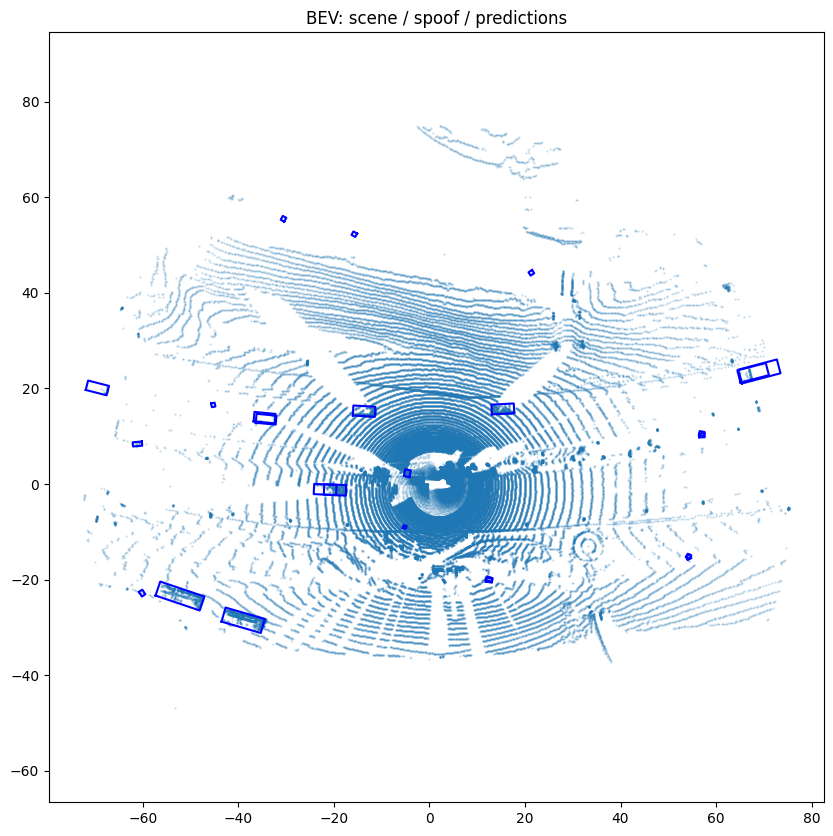

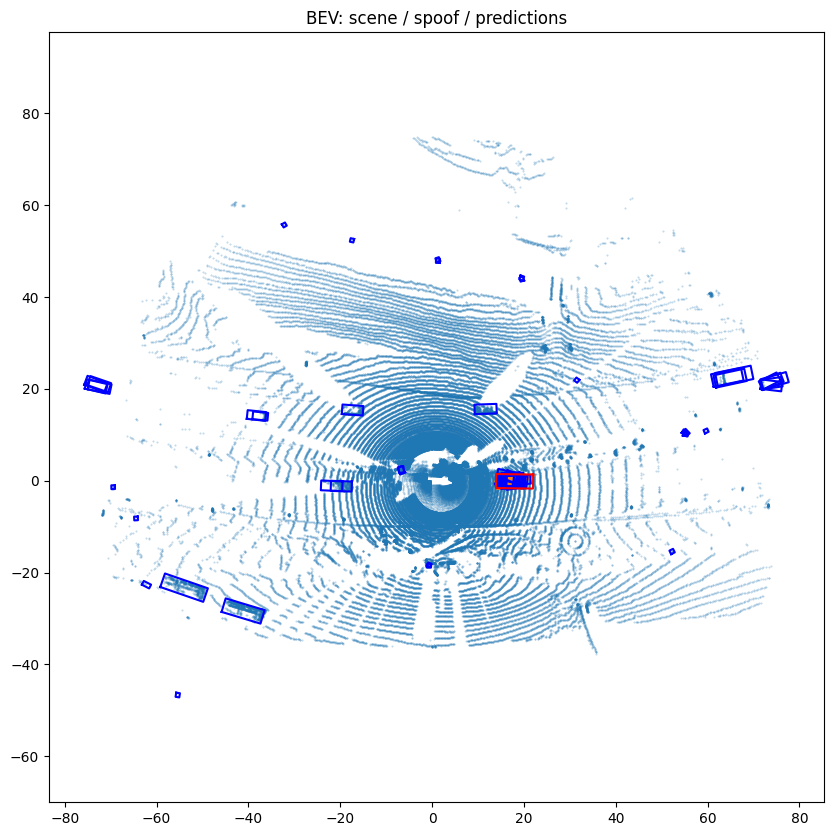

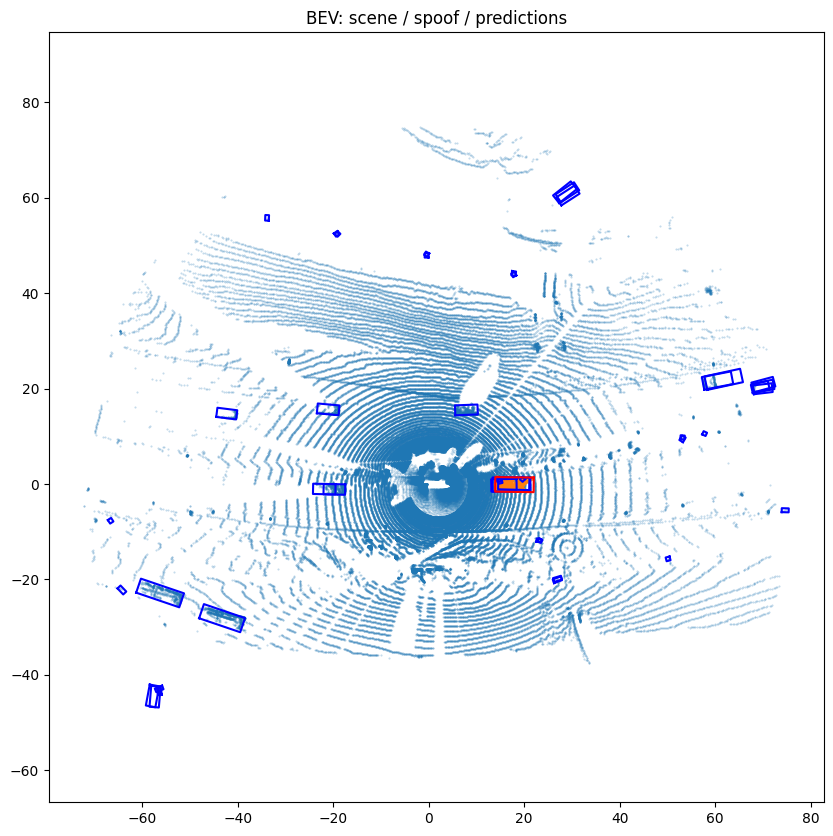

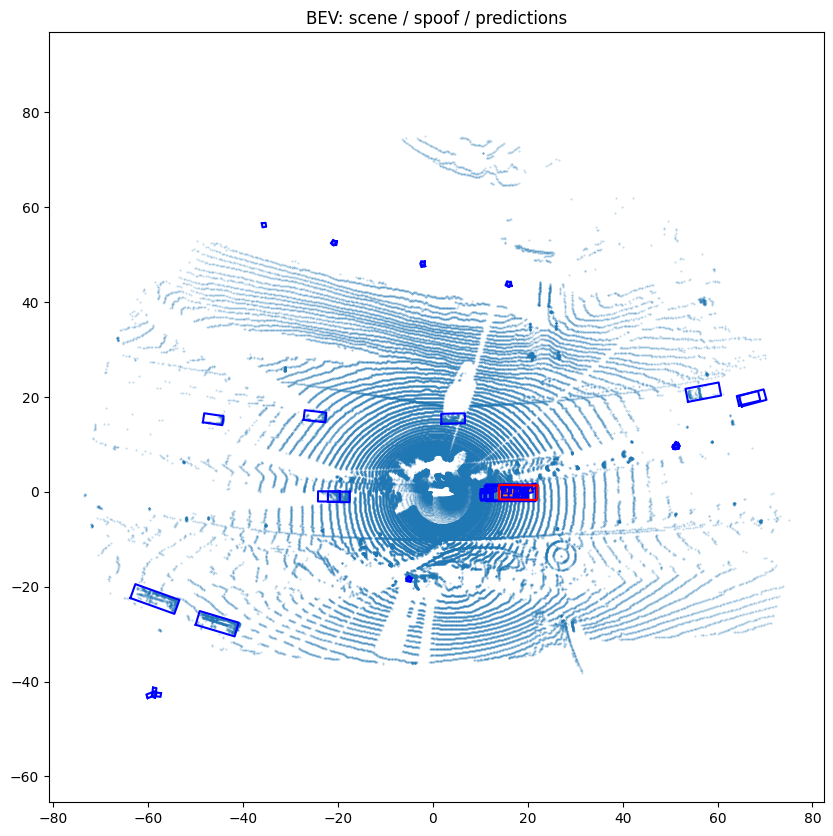

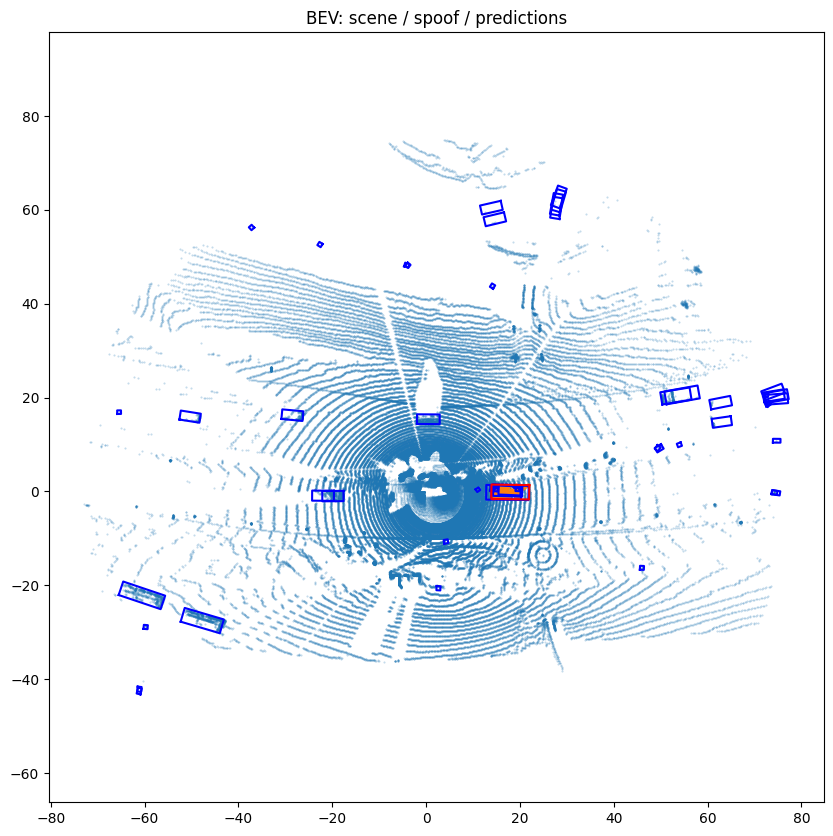

...

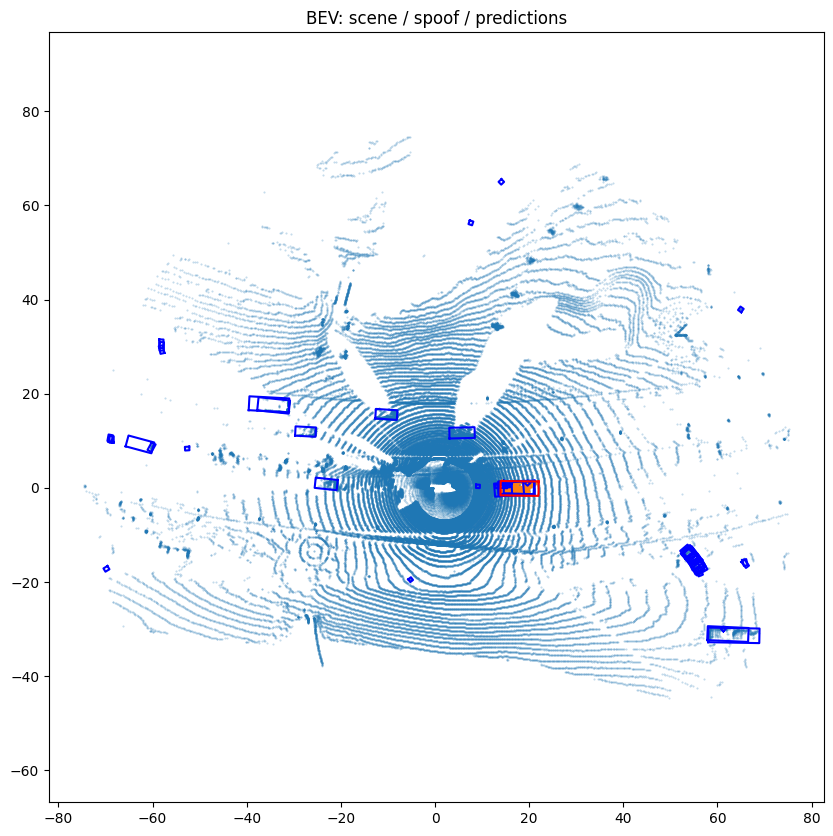

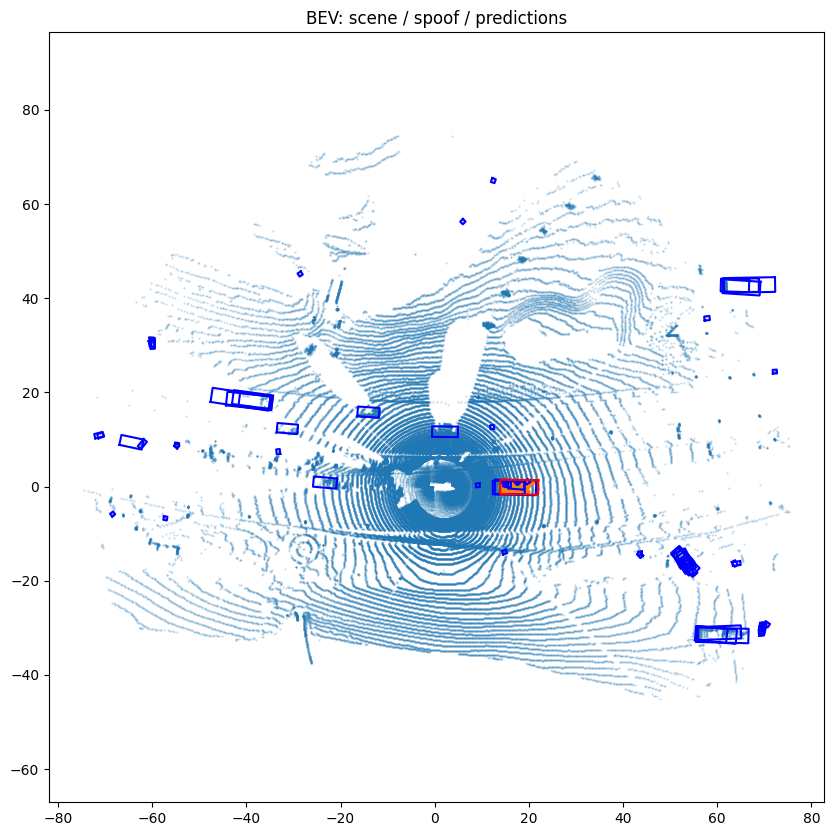

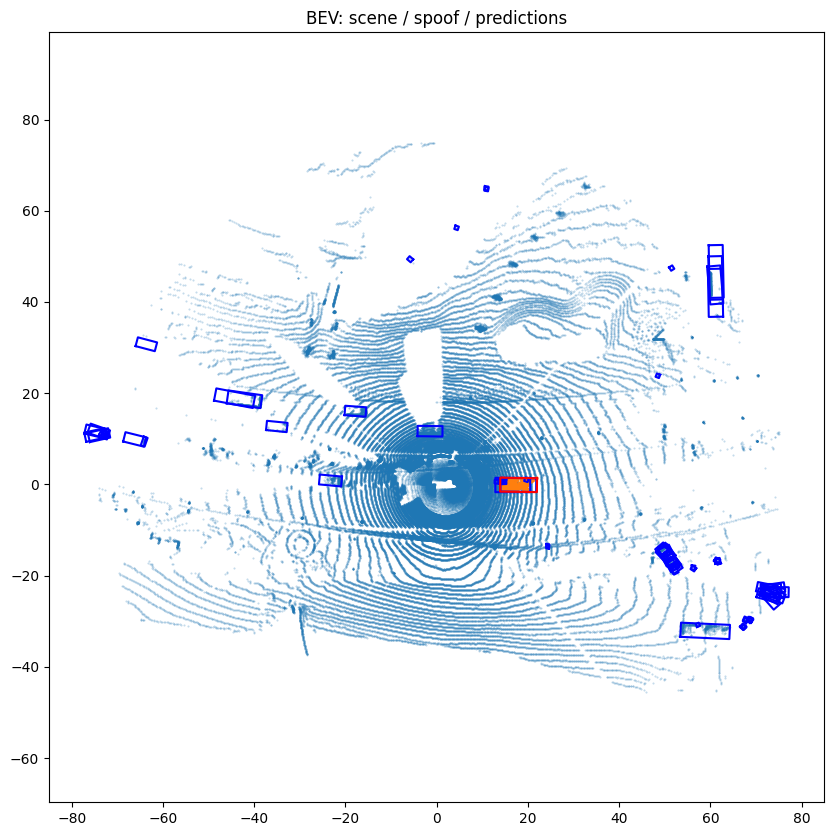

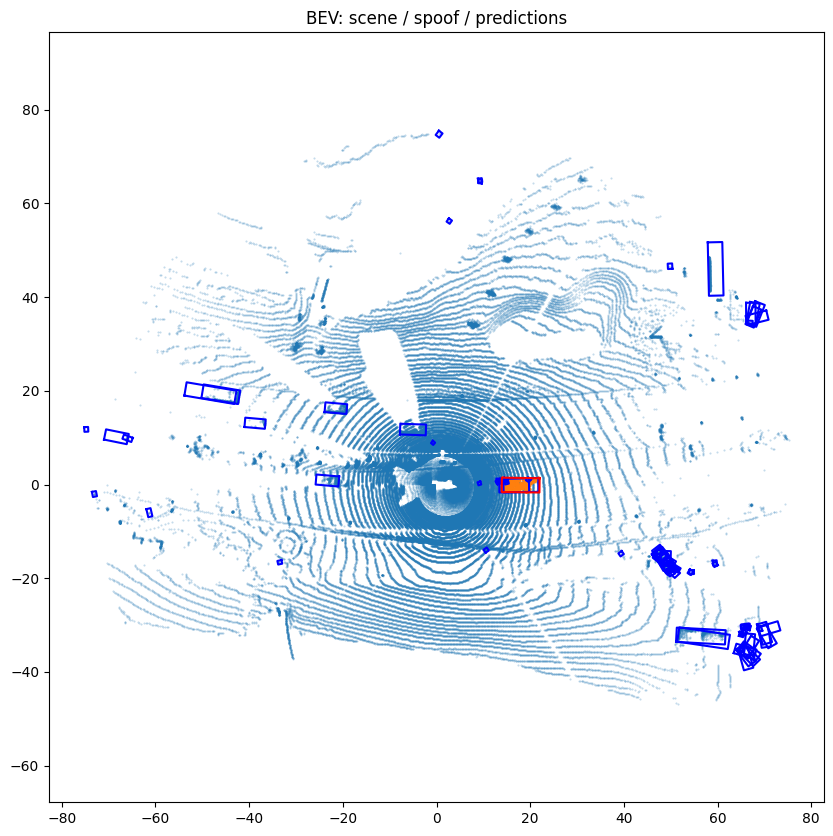

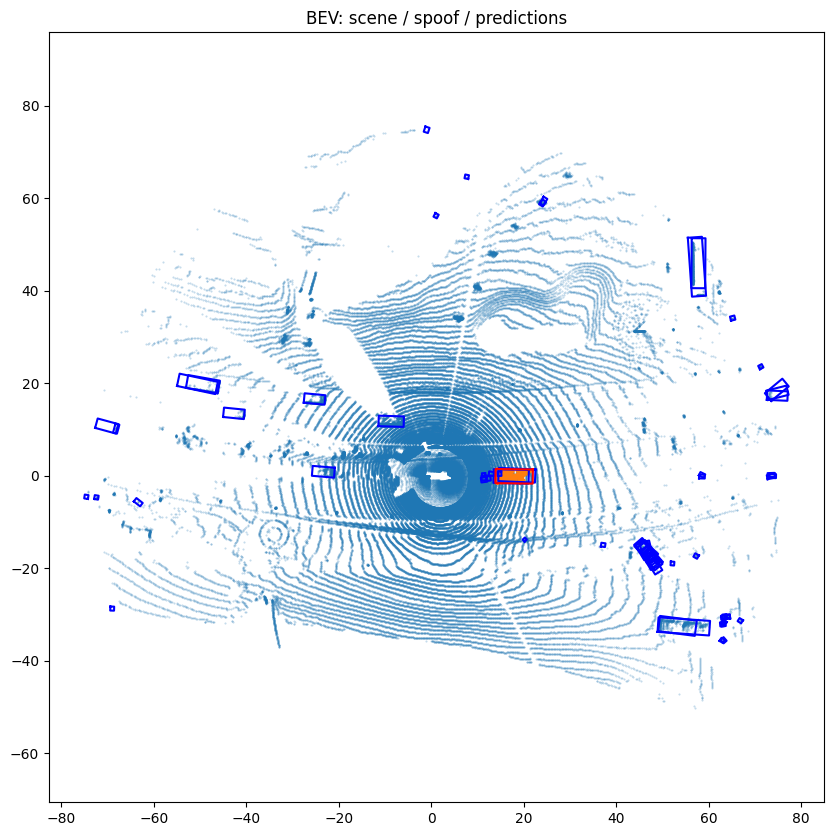

In [55]:
for j in range(31, 64):    
    i = segment_to_global[unique_segments_sf[0]][j]
    plot_bev(dataset_sf[i]['points'], target_frames[i], segment_dataset[global_to_segment[i][1]]['pred_boxes'].cpu().numpy(), segment_dataset[global_to_segment[i][1]]['spoof_gt'])

In [257]:
gt_spoof = segment_dataset[i]['spoof_gt']
gt_spoof[:7]

array([ 9.32413835,  0.84101629,  0.99174832,  5.64205934,  0.82567515,
        2.41785161, -0.5303763 ])